# House Prices Tutorial - With Catboost

This kernel was born during one of our KaggleDays meetup events in Cologne. The workshop was related to the task feature engineering even though many of us just used a brute force approach. Nonetheless I feel the strong need to dive deeper into single aspects of a more or less automatic data science workflow. 

<img src="https://cdn.pixabay.com/photo/2014/04/13/20/49/cat-323262_1280.jpg" width="600px">

If you like to work with this lift off, just fork and build uppon this sceleton. Of course you can change the model, build a model zoo etc.. Feel free to choose your personal learning path. ;-)

And please... **don't forget to UPVOTE! ;-p**

In [1]:
hold_out_size=0.2

# Load packages and data

In [2]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set()


from catboost import CatBoostRegressor, Pool, cv

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, KFold, RepeatedKFold
from sklearn.metrics import mean_squared_error as mse

import eli5
from eli5.sklearn import PermutationImportance

import hyperopt

from numpy.random import RandomState
from os import listdir


import shap
# load JS visualization code to notebook
shap.initjs()

ModuleNotFoundError: No module named 'catboost'

In [1]:
listdir("../input")

NameError: name 'listdir' is not defined

## Helper methods

In [4]:
def run_catboost(traindf, testdf, holddf, params, n_splits=10, n_repeats=1,
                 plot=False, use_features=None, plot_importance=True):
    
    
    folds = RepeatedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=1)
    p_hold = np.zeros(holddf.shape[0])
    y_hold = holddf.target
    p_test = np.zeros(testdf.shape[0])
    
    if use_features is None:
        use_features = testdf.columns.values
    
    cat_features = np.where(testdf.loc[:, use_features].dtypes=="object")[0]
    x_hold = holddf.loc[:, use_features]
    x_test = testdf.loc[:, use_features]
    
    feature_importance_df = pd.DataFrame(index=use_features)
    
    m = 0
    cv_scores = []
    for train_idx, dev_idx in folds.split(traindf):
        x_train, x_dev = traindf.iloc[train_idx][use_features], traindf.iloc[dev_idx][use_features]
        y_train, y_dev = traindf.target.iloc[train_idx], traindf.target.iloc[dev_idx]

        train_pool = Pool(x_train, y_train, cat_features=cat_features)
        dev_pool = Pool(x_dev, y_dev, cat_features=cat_features)
        model = CatBoostRegressor(**params)
        model.fit(train_pool, eval_set=dev_pool, plot=plot)

        # bagging predictions for test and hold out data:
        p_hold += model.predict(x_hold)/(n_splits*n_repeats)
        log_p_test = model.predict(x_test)
        p_test += (np.exp(log_p_test) - 1)/(n_splits*n_repeats)

        # predict for dev fold:
        y_pred = model.predict(x_dev)
        feature_importance_df.loc[:, "fold_" + str(m)] = model.get_feature_importance(train_pool)
        cv_scores.append(np.sqrt(mse(y_dev, y_pred)))
        m+=1

    print("hold out rmse: " + str(np.sqrt(mse(y_hold, p_hold))))
    print("cv mean rmse: " + str(np.mean(cv_scores)))
    print("cv std rmse: " + str(np.std(cv_scores)))
    
    feature_importance_df["mean"] = feature_importance_df.mean(axis=1)
    feature_importance_df["std"] = feature_importance_df.std(axis=1)
    feature_importance_df = feature_importance_df.sort_values(by="mean", ascending=False)
    
    if plot_importance:
        plt.figure(figsize=(15,20))
        sns.barplot(x=feature_importance_df["mean"].values[0:50], y=feature_importance_df.index.values[0:50]);
        plt.title("Feature importances");
        plt.show()
    
    results = {"last_model": model,
               "last_train_pool": train_pool,
               "feature_importance": feature_importance_df, 
               "p_hold": p_hold,
               "p_test": p_test,
               "cv_scores": cv_scores}
    return results

# Peek at the data

### Training data

In [5]:
train = pd.read_csv("../input/house-prices-advanced-regression-techniques/train.csv", index_col=0)
train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
train.shape

(1460, 80)

### Test data

In [7]:
test = pd.read_csv("../input/house-prices-advanced-regression-techniques/test.csv", index_col=0)
test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,
1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [8]:
test.shape

(1459, 79)

In [9]:
train.shape[0] / test.shape[0]

1.0006854009595614

The training data has almost the same size as the test data!

### Submission

In [10]:
submission = pd.read_csv("../input/house-prices-advanced-regression-techniques/sample_submission.csv", index_col=0)
submission.head()

,SalePrice
Id,
1461,169277.052498
1462,187758.393989
1463,183583.683570
1464,179317.477511
1465,150730.079977


# Data exploration and cleaning 


## Target distribution

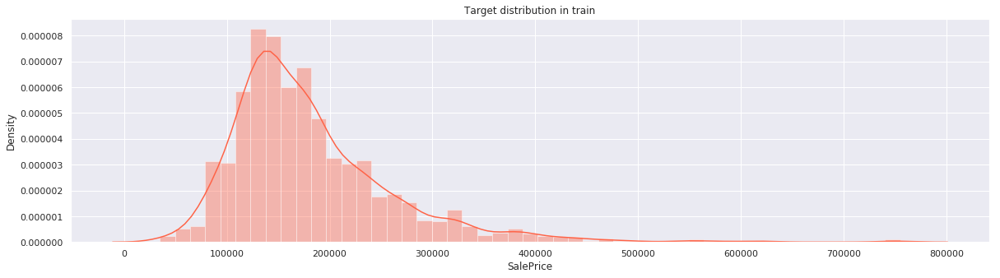

In [11]:
plt.figure(figsize=(20,5))
sns.distplot(train.SalePrice, color="tomato")
plt.title("Target distribution in train")
plt.ylabel("Density");

The sale price distribution is right-skewed and shows extreme outliers. In the case we are going to use the mean squared error loss for optimization, we should log transform the predictions and the target values!

In [12]:
train[train.SalePrice <=0 ]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,


We don't have to worry about negative or zero house prices.

## Missing values

In [13]:
combined = train.drop("SalePrice", axis=1).append(test)
nan_percentage = combined.isnull().sum().sort_values(ascending=False) / combined.shape[0]
missing_val = nan_percentage[nan_percentage > 0]

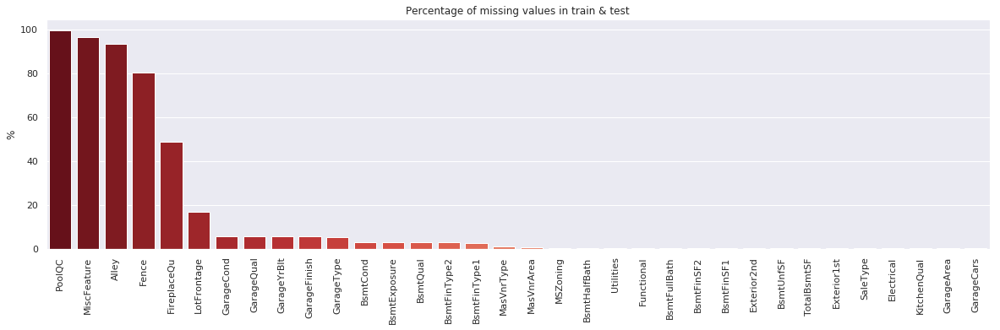

In [14]:
plt.figure(figsize=(20,5))
sns.barplot(x=missing_val.index.values, y=missing_val.values * 100, palette="Reds_r");
plt.title("Percentage of missing values in train & test");
plt.ylabel("%");
plt.xticks(rotation=90);

Ok, first decision to make: Let's drop all features with missing values above 10 %. 

In [15]:
to_drop = missing_val[missing_val > 0.1].index.values
combined = combined.drop(to_drop, axis=1)
combined.shape

(2919, 73)

## Categorical candidates

In [16]:
cat_candidates = combined.dtypes[combined.dtypes=="object"].index.values
cat_candidates

array(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition'], dtype=object)

### Feature Importance by level frequencies

Some categorical features might be completely useless as only some levels occur most of the time (no diversity). To get more insights, we can compute the frequency of the most common level in the train & test data:

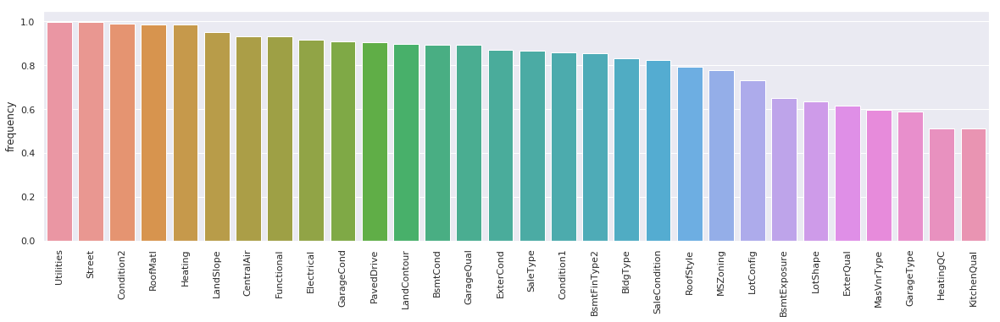

In [17]:
frequencies = []
for col in cat_candidates:
    overall_freq = combined.loc[:, col].value_counts().max() / combined.shape[0]
    frequencies.append([col, overall_freq])

frequencies = np.array(frequencies)
freq_df = pd.DataFrame(index=frequencies[:,0], data=frequencies[:,1], columns=["frequency"])
sorted_freq = freq_df.frequency.sort_values(ascending=False)

plt.figure(figsize=(20,5))
sns.barplot(x=sorted_freq.index[0:30], y=sorted_freq[0:30].astype(np.float))
plt.xticks(rotation=90);

### Insights

Many categorical candidates have one major level that occupies > 80 % of the data. That's bad. What should we learn from such a feature? Let's pick some examples:

In [18]:
example = "Utilities"
combined.loc[:,example].value_counts()

AllPub    2916
NoSeWa       1
Name: Utilities, dtype: int64

This is a completely useless feature! Let's drop all features that show a most common value of 90 %. 

In [19]:
freq_df.frequency = freq_df.frequency.astype(np.float)
cats_to_drop = freq_df[freq_df.frequency >= 0.9].index.values
len(cats_to_drop)

11

In [20]:
cats_to_drop

array(['Street', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl',
       'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageCond',
       'PavedDrive'], dtype=object)

In [21]:
combined = combined.drop(cats_to_drop, axis=1)
combined.shape

(2919, 62)

In [22]:
cat_candidates = combined.dtypes[combined.dtypes=="object"].index.values
cat_candidates

array(['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood',
       'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual',
       'GarageType', 'GarageFinish', 'GarageQual', 'SaleType',
       'SaleCondition'], dtype=object)

### Fusing categorical levels

Let's dive deeper into explorations by discovering each remaining categorical candidate:

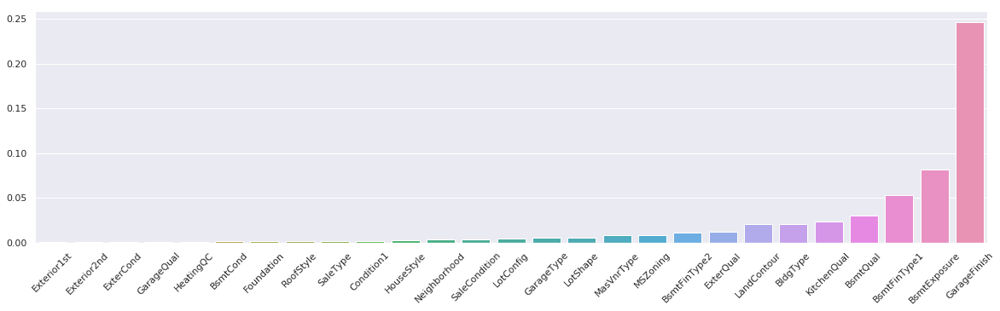

In [23]:
min_frequency = pd.Series(index=cat_candidates)
for col in cat_candidates:
    min_frequency.loc[col] = combined.loc[:,col].value_counts().min() / combined.shape[0]
min_frequency = min_frequency.sort_values()

plt.figure(figsize=(20,5))
sns.barplot(x=min_frequency.index, y=min_frequency.values)
plt.xticks(rotation=45);

### Insights

Many categorical candidates have less frequent levels. This is a problem as it might be difficult to generalize well during training if there is only a handful of samples with a specific level. We could either fuse levels or we add information to the frequency of levels as well as level target information like mean, median, std. As I would like to do more stuff atomatically, let's choose the second way after dealing with the numerical features. 

## Numerical candidates

In [24]:
num_candidates = combined.dtypes[combined.dtypes!="object"].index.values
num_candidates

array(['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'],
      dtype=object)

In [25]:
combined.loc[:, num_candidates].head(10)

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
Id,,,,,,,,,,,,,,,,,,,,,
1,60,8450,7,5,2003,2003,196.0,706.0,0.0,150.0,...,548.0,0,61,0,0,0,0,0,2,2008
2,20,9600,6,8,1976,1976,0.0,978.0,0.0,284.0,...,460.0,298,0,0,0,0,0,0,5,2007
3,60,11250,7,5,2001,2002,162.0,486.0,0.0,434.0,...,608.0,0,42,0,0,0,0,0,9,2008
4,70,9550,7,5,1915,1970,0.0,216.0,0.0,540.0,...,642.0,0,35,272,0,0,0,0,2,2006
5,60,14260,8,5,2000,2000,350.0,655.0,0.0,490.0,...,836.0,192,84,0,0,0,0,0,12,2008
6,50,14115,5,5,1993,1995,0.0,732.0,0.0,64.0,...,480.0,40,30,0,320,0,0,700,10,2009
7,20,10084,8,5,2004,2005,186.0,1369.0,0.0,317.0,...,636.0,255,57,0,0,0,0,0,8,2007
8,60,10382,7,6,1973,1973,240.0,859.0,32.0,216.0,...,484.0,235,204,228,0,0,0,350,11,2009
9,50,6120,7,5,1931,1950,0.0,0.0,0.0,952.0,...,468.0,90,0,205,0,0,0,0,4,2008


Just by looking at the data we can see that there are a lot of features that are not numeric but categorical like OverallQual and OverallCond. 

In [26]:
next_cat_candidates = [
    "OverallQual", "OverallCond", "MSSubClass", 'BsmtFullBath',
    'BsmtHalfBath','FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
    'TotRmsAbvGrd', 'Fireplaces', 'GarageCars'
]
len(next_cat_candidates)

12

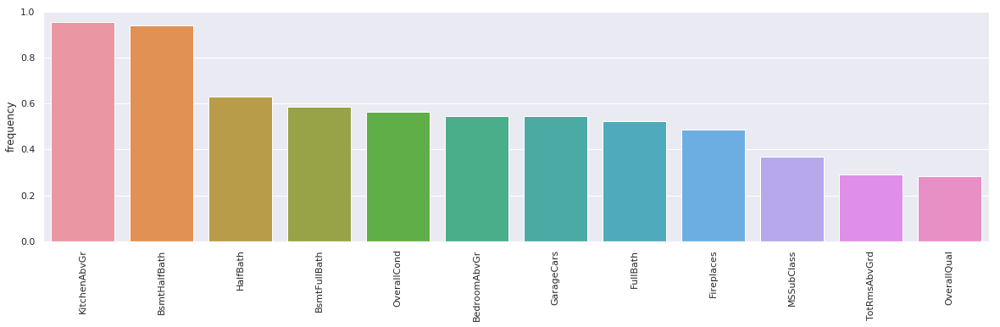

In [27]:
frequencies = []
for col in next_cat_candidates:
    overall_freq = combined.loc[:, col].value_counts().max() / combined.shape[0]
    frequencies.append([col, overall_freq])

frequencies = np.array(frequencies)
freq_df = pd.DataFrame(index=frequencies[:,0], data=frequencies[:,1], columns=["frequency"])
sorted_freq = freq_df.frequency.sort_values(ascending=False)

plt.figure(figsize=(20,5))
sns.barplot(x=sorted_freq.index[0:30], y=sorted_freq[0:30].astype(np.float))
plt.xticks(rotation=90);

In [28]:
cats_to_drop = ["KitchenAbvGr", "BsmtHalfBath"]
combined = combined.drop(cats_to_drop, axis=1)

In [29]:
for col in cats_to_drop:
    next_cat_candidates.remove(col)

In [30]:
for col in next_cat_candidates:
    combined[col] = combined[col].astype("object")

In [31]:
num_candidates = combined.dtypes[combined.dtypes!="object"].index.values
num_candidates

array(['LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'],
      dtype=object)

## Imputing missing values

In [32]:
def impute_na_trees(df, col):
    if df[col].dtype == "object":
        df[col] = df[col].fillna("Unknown")
    else:
        df[col] = df[col].fillna(-99999)
    return df

In [33]:
for col in combined.columns:
    combined = impute_na_trees(combined, col)

In [34]:
combined.isnull().sum().sum()

0

# Computing benchmark predictions with catboost

This data has many categorical features and one model that can deal nicely with these kind of features is [catboost](https://catboost.ai/). If you like to read more about it, you can find a [paper here](https://arxiv.org/abs/1706.09516). Actually we have dropped all categorical features by encoding them but later on after feature exploration we may like to use them with catboost to use target encoding as well.

In [35]:
traindf = combined.iloc[0:train.shape[0]].copy()
traindf.loc[:, "target"] = np.log(train.SalePrice+1)
testdf = combined.iloc[train.shape[0]::].copy()

### Generating hold out data

I like to use the hold out data later for ensembling. 

In [36]:
traindf, holddf = train_test_split(traindf, test_size=hold_out_size, random_state=0)
print((traindf.shape, holddf.shape, testdf.shape))

((1168, 61), (292, 61), (1459, 60))


### Model parameter

In [37]:
org_params = {
    'iterations': 1000,
    'learning_rate': 0.1,
    'eval_metric': 'RMSE',
    'random_seed': 42,
    'logging_level': 'Silent',
    'use_best_model': True,
    'loss_function': 'RMSE',
    'od_type': 'Iter',
    'od_wait': 200,
    'one_hot_max_size': 5,
    'l2_leaf_reg': 3,
    'depth': 4
}

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

hold out rmse: 0.16573459322636697
cv mean rmse: 0.207781667443683
cv std rmse: 0.02053384486996194


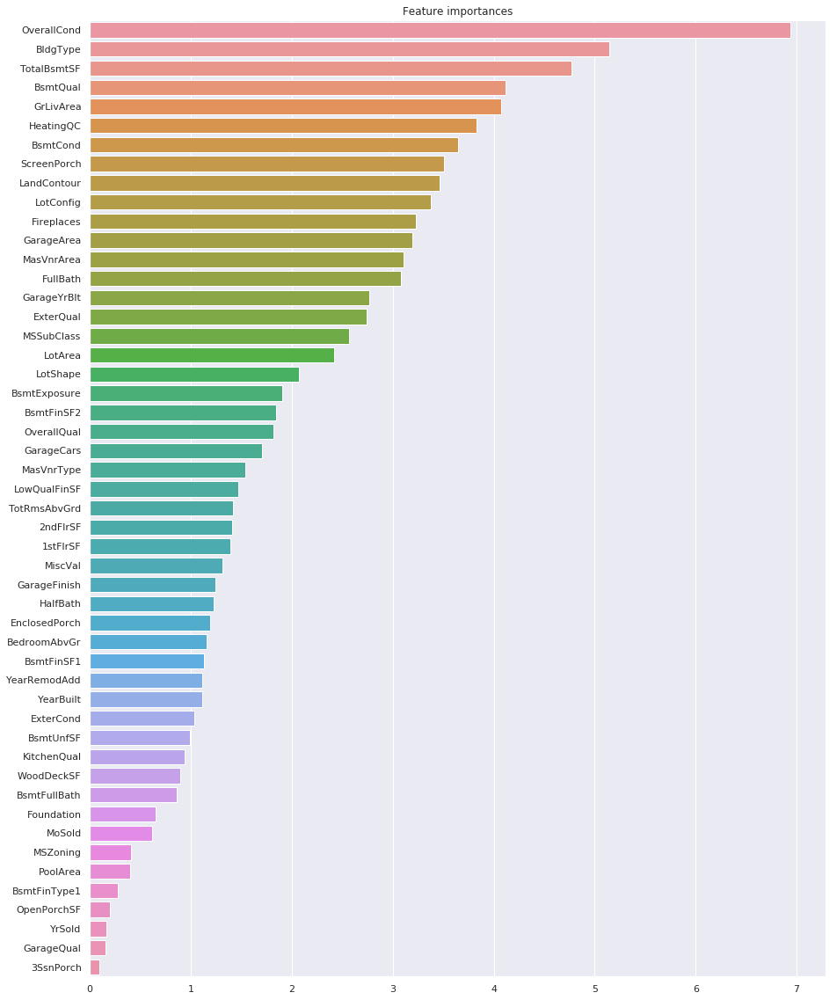

In [38]:
results = run_catboost(traindf, 
                       testdf,
                       holddf,
                       org_params,
                       plot=True,
                       n_splits=6,
                       n_repeats=1)
p_hold = results["p_hold"]
p_test = results["p_test"]
feature_importance_df = results["feature_importance"]

### Insights

* A lot of feature were not used by catboost and are not important for our task. You can see that many of them belong to those features that show only a few variation like LandContour, BsmtCond and GarageQual. This confirms our approach to drop such kind of features even more. 

In [39]:
feature_importance_df.head(5)

,fold_0,fold_1,fold_2,fold_3,fold_4,fold_5,mean,std
OverallCond,0.303748,9.932156,7.986857,8.287458,5.024268,10.110311,6.940800,3.406496
BldgType,4.747498,1.138474,5.716194,6.209278,8.164599,4.880535,5.142763,2.115699
TotalBsmtSF,9.487560,2.495062,1.921742,8.786909,4.548386,1.356598,4.766043,3.250107
BsmtQual,2.124582,3.469380,2.077610,0.917083,3.074816,13.017684,4.113526,4.063988
GrLivArea,4.285525,4.128227,3.743484,4.350292,4.799599,3.138760,4.074314,0.521924


### Insights

* There is a lot of variation of the feature importance between folds! What does this mean?
    * How useful a feature is to fit the training data depends on the data itself and how big the dataset is.
    * If you increase the number of splits the most important features will change! Try it out!
    * Remember that our test dataset is the same size as the training dataset. It's very likely that we will overfit to our training data and that we will not be able to generalize well on the test data. 
* What can we do to reduce this problem?
    * We should drop features that almost have no importance!
    * We should include more randomess to our KFold as well (run it several times, make averaged predictions with each KFold)
    * We should use different models that contribute to our prediction.

Let's figure it out by playing with these concepts. ;-)
    

In [40]:
submission.loc[testdf.index.values, "SalePrice"] = p_test
submission = submission.reset_index()
submission.head()

,Id,SalePrice
0,1461,121692.673581
1,1462,144939.822800
2,1463,195669.064231
3,1464,195878.460892
4,1465,175185.293685


In [41]:
submission.to_csv("submission_before_feature_selection.csv", index=False)
submission = submission.set_index("Id")
submission.head()

,SalePrice
Id,
1461,121692.673581
1462,144939.822800
1463,195669.064231
1464,195878.460892
1465,175185.293685


## Feature selection

We could try to remove features recursively. I like this approach very much but it costs a lot of time to evaluate the model every time. This data is not that big, so we can do it! :-)

In [42]:
sorted_features = feature_importance_df.sort_values(by="mean").index.values
len(sorted_features)

60

Let's take a step size of 5. This way we need to evaluate the model 12 times num_splits * num_repeats.

In [43]:
step = 5
total_steps = int(len(sorted_features) / step)
total_steps

12

In [44]:
for jump in range(0, total_steps):
    print(jump)
    used_features = sorted_features[jump*step::]
    results = run_catboost(traindf, 
                       testdf,
                       holddf,
                       org_params,
                       plot=False,
                       plot_importance=False,
                       use_features=used_features,
                       n_splits=6,
                       n_repeats=1)

0
hold out rmse: 0.17233673315952786
cv mean rmse: 0.23453339048075664
cv std rmse: 0.013775014500641735
1
hold out rmse: 0.17851368273308457
cv mean rmse: 0.20678976841569194
cv std rmse: 0.009868049260792565
2
hold out rmse: 0.1895088913407928
cv mean rmse: 0.22306155638232686
cv std rmse: 0.03057681032993002
3
hold out rmse: 0.16181722549528899
cv mean rmse: 0.22201654360127043
cv std rmse: 0.022146736525210348
4
hold out rmse: 0.19170671370581366
cv mean rmse: 0.20990674250042177
cv std rmse: 0.029947340509030106
5
hold out rmse: 0.18118675138212978
cv mean rmse: 0.18305813852930483
cv std rmse: 0.019790451161290634
6
hold out rmse: 0.17826417793318322
cv mean rmse: 0.21471914606139011
cv std rmse: 0.02277764307441835
7
hold out rmse: 0.20745725662433673
cv mean rmse: 0.21251979901970963
cv std rmse: 0.017481668253283338
8
hold out rmse: 0.20475014300115005
cv mean rmse: 0.20773960962926089
cv std rmse: 0.019341427475429353
9
hold out rmse: 0.1972443197572676
cv mean rmse: 0.216136

**CAUTION OLD VERSION**

Ok, first of all, let's drop the last 10 features of our sorted importances:

In [45]:
to_drop = feature_importance_df.iloc[-20:].index.values
combined = combined.drop(to_drop, axis=1)
to_drop

array(['BsmtFullBath', 'Foundation', 'MoSold', 'MSZoning', 'PoolArea',
       'BsmtFinType1', 'OpenPorchSF', 'YrSold', 'GarageQual', '3SsnPorch',
       'SaleCondition', 'RoofStyle', 'Condition1', 'BsmtFinType2',
       'GarageType', 'HouseStyle', 'SaleType', 'Exterior1st',
       'Exterior2nd', 'Neighborhood'], dtype=object)

In [46]:
traindf = combined.iloc[0:train.shape[0]].copy()
traindf.loc[:, "target"] = np.log(train.SalePrice+1)
testdf = combined.iloc[train.shape[0]::].copy()

In [47]:
traindf, holddf = train_test_split(traindf, test_size=hold_out_size, random_state=0)
print((traindf.shape, holddf.shape, testdf.shape))


((1168, 41), (292, 41), (1459, 40))


hold out rmse: 0.19840462952556956
cv mean rmse: 0.20834325253597016
cv std rmse: 0.02528230118130432


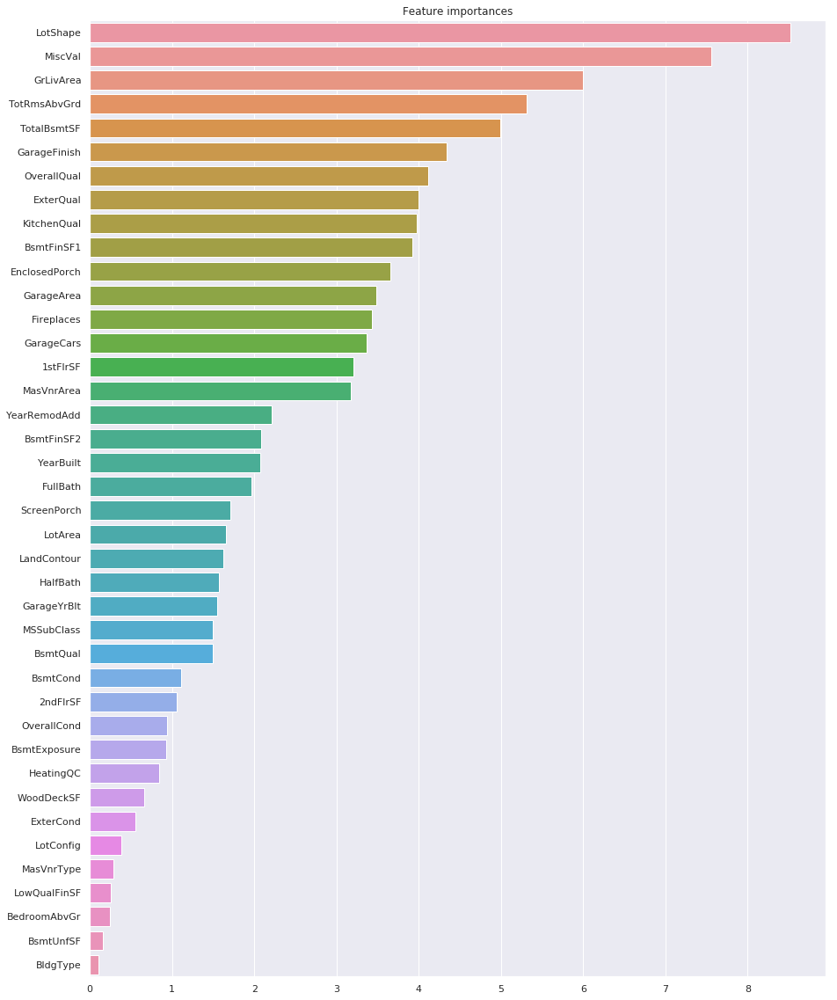

In [48]:
results = run_catboost(traindf,
                       testdf,
                       holddf,
                       org_params,
                       n_splits=6,
                       n_repeats=1)
p_hold = results["p_hold"]
p_test = results["p_test"]
feature_importance_df = results["feature_importance"]

In [49]:
feature_importance_df.head(5)

,fold_0,fold_1,fold_2,fold_3,fold_4,fold_5,mean,std
LotShape,10.243388,14.052218,11.860743,13.271311,1.575010,0.131799,8.522412,5.566354
MiscVal,11.451672,8.340365,11.749491,9.360965,0.192431,4.235788,7.555119,4.120694
GrLivArea,7.400236,7.186823,7.983449,7.394689,3.483170,2.507221,5.992598,2.151823
TotRmsAbvGrd,3.585938,4.372507,4.338353,4.182958,5.764764,9.655712,5.316705,2.047655
TotalBsmtSF,3.566668,3.469803,3.995295,3.586586,8.446321,6.868256,4.988821,1.948071


In [50]:
submission.loc[testdf.index.values, "SalePrice"] = p_test
submission = submission.reset_index()
submission.head()

,Id,SalePrice
0,1461,120280.524858
1,1462,114496.072005
2,1463,190832.678667
3,1464,195950.499226
4,1465,170957.831689


In [51]:
submission.to_csv("submission_feature_selection.csv", index=False)
submission = submission.set_index("Id")
submission.head()

,SalePrice
Id,
1461,120280.524858
1462,114496.072005
1463,190832.678667
1464,195950.499226
1465,170957.831689


This scores slightly better on the public LB for test data than without. ;-)

## The influence of data splitting

The way we split our data into folds for cross validation definitely affects the learning and predictions of our models. To average out this effect we might like to run the cross validation several times with different random seeds and compute the mean of all model predictions:

hold out rmse: 0.18105024367196842
cv mean rmse: 0.2132375321201823
cv std rmse: 0.021509502614360014


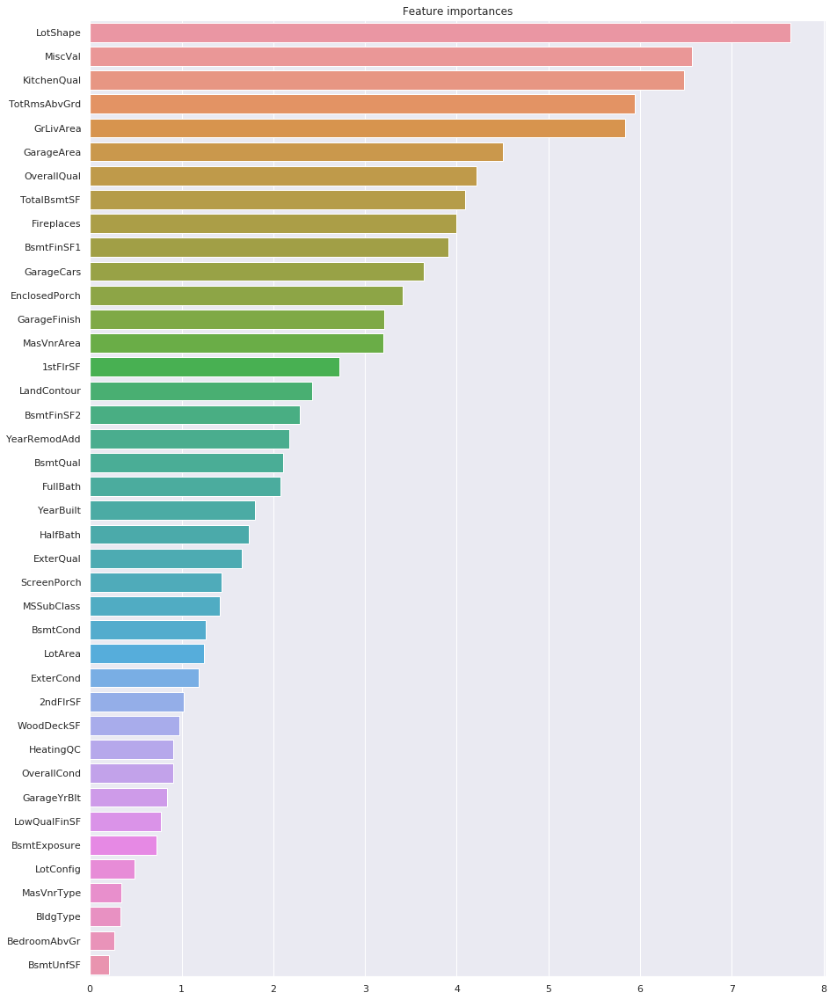

In [52]:
results = run_catboost(traindf,
                       testdf,
                       holddf,
                       org_params,
                       n_splits=6,
                       n_repeats=10)
p_hold = results["p_hold"]
p_test = results["p_test"]
feature_importance_df = results["feature_importance"]

In [53]:
submission.loc[testdf.index.values, "SalePrice"] = p_test
submission = submission.reset_index()

In [54]:
submission.to_csv("submission_repeated_kfold.csv", index=False)
submission = submission.set_index("Id")
submission.head()

,SalePrice
Id,
1461,121953.881006
1462,122913.138181
1463,189294.479181
1464,196406.473449
1465,164652.318568


This yields a further push small on the LB!

# Feature engineering

## Feature Interaction

With catboost we can also discover feature interactions with a depth > 1. This way we can see which features are often found as a combination in single trees:

In [55]:
cat_features = np.where(testdf.dtypes == "object")[0]

In [56]:
x_train, x_dev = traindf.drop("target", axis=1), holddf.drop("target", axis=1)
y_train, y_dev = traindf.target, holddf.target

train_pool = Pool(x_train, y_train, cat_features=cat_features)
dev_pool = Pool(x_dev, y_dev, cat_features=cat_features)
model = CatBoostRegressor(**org_params)
model.fit(train_pool, eval_set=dev_pool, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

I really love the next feature: ;-)

In [57]:
interaction = model.get_feature_importance(train_pool, type="Interaction")
column_names = testdf.columns.values 
interaction = pd.DataFrame(interaction, columns=["feature1", "feature2", "importance"])
interaction.feature1 = interaction.feature1.apply(lambda l: column_names[int(l)])
interaction.feature2 = interaction.feature2.apply(lambda l: column_names[int(l)])
interaction.head(20)

,feature1,feature2,importance
0,BsmtFinSF1,TotalBsmtSF,2.198128
1,2ndFlrSF,GrLivArea,1.803272
2,GrLivArea,BedroomAbvGr,1.773179
3,2ndFlrSF,Fireplaces,1.575559
4,2ndFlrSF,FullBath,1.529600
5,2ndFlrSF,EnclosedPorch,1.455663
6,YearBuilt,WoodDeckSF,1.398443
7,GarageYrBlt,EnclosedPorch,1.251035
8,2ndFlrSF,GarageYrBlt,1.169960
9,MSSubClass,LotArea,1.008608


### Insights

* There are a lot of interactions between area related features! (numerical features)
* As there are so many numerical features interacting with each other, it might be very helpful to use further models that are better in dealing with continuous data like neural networks or linear models. 
* Let's discover interacting features with an exploratory analysis!

## Generating new features based on interactions

In [58]:
interaction["feature1_type"] = interaction.feature1.apply(
    lambda l: np.where(testdf[l].dtype=="object", 0, 1)
)
interaction["feature2_type"] = interaction.feature2.apply(
    lambda l: np.where(testdf[l].dtype=="object", 0, 1)
)
interaction.head()

,feature1,feature2,importance,feature1_type,feature2_type
0,BsmtFinSF1,TotalBsmtSF,2.198128,1,1
1,2ndFlrSF,GrLivArea,1.803272,1,1
2,GrLivArea,BedroomAbvGr,1.773179,1,1
3,2ndFlrSF,Fireplaces,1.575559,1,1
4,2ndFlrSF,FullBath,1.529600,1,1


In [59]:
interaction["combination"] = interaction.feature1_type + interaction.feature2_type
interaction.combination.value_counts()

2    249
Name: combination, dtype: int64

In [60]:
numerical_combi = interaction[interaction.combination==2].copy()
for n in numerical_combi.index.values:
    feat1 = numerical_combi.loc[n].feature1
    feat2 = numerical_combi.loc[n].feature2
    if combined[feat1].max() > combined[feat2].max():
        combined[feat2 + "_" + feat1 + "_frac"] = combined[feat2] / combined[feat1]
    else:
        combined[feat1 + "_" + feat2 + "_frac"] = combined[feat1] / combined[feat2]
    combined[feat2 + "_" + feat1 + "_mult"] = combined[feat2] * combined[feat1]
    combined[feat2 + "_" + feat1 + "_add"] = combined[feat2] + combined[feat1]
    combined[feat2 + "_" + feat1 + "_sub"] = combined[feat2] - combined[feat1]

In [61]:
mixed_combi = interaction[interaction.combination==1].copy()
for n in mixed_combi.index.values:
    feat1 = mixed_combi.loc[n].feature1
    feat2 = mixed_combi.loc[n].feature2
    if combined[feat1].dtype=="object":
        combined["grouped_" + feat1 + "_mean_" + feat2] = combined[feat1].map(
            combined.groupby(feat1)[feat2].mean())
        combined["grouped_" + feat1 + "_std_" + feat2] = combined[feat1].map(
            combined.groupby(feat1)[feat2].std())

In [62]:
combined.head()

,MSSubClass,LotArea,LotShape,LandContour,LotConfig,BldgType,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,WoodDeckSF_1stFlrSF_add,WoodDeckSF_1stFlrSF_sub,MasVnrArea_1stFlrSF_frac,1stFlrSF_MasVnrArea_mult,1stFlrSF_MasVnrArea_add,1stFlrSF_MasVnrArea_sub,HalfBath_YearBuilt_frac,HalfBath_YearBuilt_mult,HalfBath_YearBuilt_add,HalfBath_YearBuilt_sub
Id,,,,,,,,,,,,,,,,,,,,,
1,60,8450,Reg,Lvl,Inside,1Fam,7,5,2003,2003,...,856,-856,0.228972,167776.0,1052.0,660.0,0.000499,2003,2004,-2002
2,20,9600,Reg,Lvl,FR2,1Fam,6,8,1976,1976,...,1560,-964,0.000000,0.0,1262.0,1262.0,0.000000,0,1976,-1976
3,60,11250,IR1,Lvl,Inside,1Fam,7,5,2001,2002,...,920,-920,0.176087,149040.0,1082.0,758.0,0.000500,2001,2002,-2000
4,70,9550,IR1,Lvl,Corner,1Fam,7,5,1915,1970,...,961,-961,0.000000,0.0,961.0,961.0,0.000000,0,1915,-1915
5,60,14260,IR1,Lvl,FR2,1Fam,8,5,2000,2000,...,1337,-953,0.305677,400750.0,1495.0,795.0,0.000500,2000,2001,-1999


In [63]:
traindf = combined.iloc[0:train.shape[0]].copy()
traindf.loc[:, "target"] = np.log(train.SalePrice+1)
testdf = combined.iloc[train.shape[0]::].copy()

In [64]:
traindf, holddf = train_test_split(traindf, test_size=hold_out_size, random_state=0)
print((traindf.shape, holddf.shape, testdf.shape))

x_hold = holddf.drop("target", axis=1)
y_hold = holddf.target
x_test = testdf

((1168, 1037), (292, 1037), (1459, 1036))


In [65]:
cat_features = np.where(testdf.dtypes == "object")[0]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

hold out rmse: 0.17338237268164253
cv mean rmse: 0.21213488334218647
cv std rmse: 0.03460229234563333


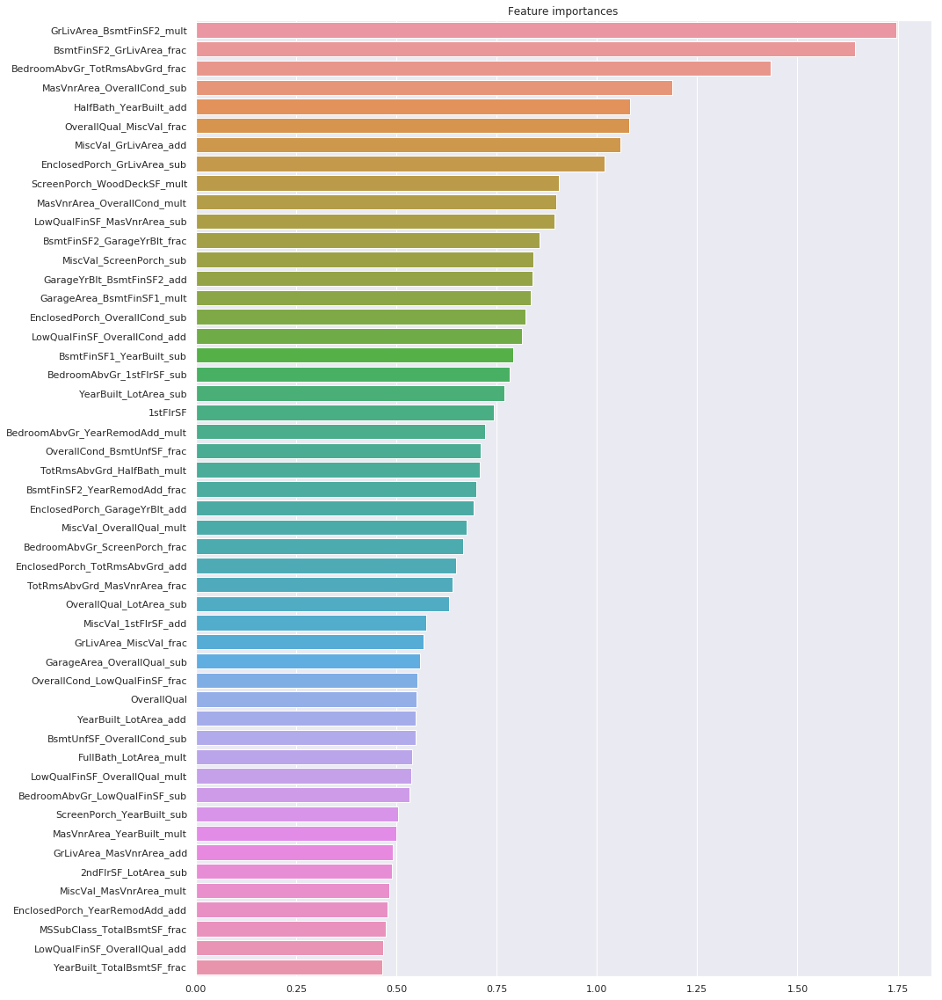

In [66]:
results = run_catboost(traindf,
                       testdf,
                       holddf,
                       org_params,
                       plot=True,
                       n_splits=10,
                       n_repeats=1)
p_hold = results["p_hold"]
p_test = results["p_test"]
feature_importance_df = results["feature_importance"]

In [67]:
submission.loc[testdf.index.values, "SalePrice"] = p_test
submission = submission.reset_index()

In [68]:
submission.to_csv("submission_feature_interaction_explosion.csv", index=False)
submission = submission.set_index("Id")
submission.head()

,SalePrice
Id,
1461,131730.522396
1462,111000.197047
1463,199513.230322
1464,194315.394327
1465,159585.910080


# Ensembling

#### Todo

Do you like to visualize model results with [shap values](https://github.com/slundberg/shap)? 

In [69]:
#explainer = shap.TreeExplainer(model)
#shap_values = explainer.shap_values(holddf.drop("target", axis=1))
#shap.summary_plot(shap_values, holddf)

In [70]:
#shap_values = model.get_feature_importance(
    #Pool(new_holddf, hold_target, cat_features=new_categorical_features_indices),
    #type='ShapValues'
#)

#expected_value = shap_values[0,-1]
#shap_values = shap_values[:,:-1]

In [71]:
#shap.summary_plot(shap_values, new_holddf)

## Happy kaggling! ;-)